Import Data

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

data = pd.read_stata("callreports_final.dta", chunksize=100000, preserve_dtypes=True)

df_raw = pd.DataFrame()

for chunk in data:
    df_raw=df_raw.append(chunk)

Additional Settings

In [2]:
%matplotlib inline
import numpy as np
import seaborn as sns
import statsmodels.api as sm
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)
import matplotlib.ticker as ticker

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "last_expr"

pd.set_option('mode.chained_assignment', None)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 18

plt.style.use('default')


plt.rcParams['font.size']=BIGGER_SIZE          # controls default text sizes
plt.rcParams['axes.titlesize']=BIGGER_SIZE     # fontsize of the axes title
plt.rcParams['axes.labelsize']=BIGGER_SIZE    # fontsize of the x and y labels
plt.rcParams['xtick.labelsize']=BIGGER_SIZE    # fontsize of the tick labels
plt.rcParams['ytick.labelsize']=BIGGER_SIZE    # fontsize of the tick labels
plt.rcParams['legend.fontsize']=BIGGER_SIZE    # legend fontsize
plt.rcParams['figure.titlesize']=BIGGER_SIZE  # fontsize of the figure title

from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

#removing Goldman Sachs and Morgan Stanley
df_raw = df_raw[(df_raw.rssdid!=1456501) & (df_raw.bhcid!=2380443)]


Functions for plotting crisis shades on graph

In [3]:
def plot_crisis(ax):
    #1980Q1-Q3 crisis
    ax.axvspan(16, 19, alpha=0.5, color='gray')


    #1981Q3-1982Q4 crisis
    ax.axvspan(22, 27, alpha=0.5, color='gray')

    #1990Q3-1991Q2 crisis
    ax.axvspan(58, 61, alpha=0.5, color='gray')

    #2001Q2-2001Q4 crisis
    ax.axvspan(101, 103, alpha=0.5, color='gray')

    #2007Q4-2009Q3 crisis
    ax.axvspan(127, 134, alpha=0.5, color='gray')

In [4]:
years = [str(year) for year in range(1976, 2014)]

def axsetting(ax):
    ax.set_xticks(range(0,151,4))
    ax.xaxis.set_minor_locator(AutoMinorLocator(4))
    ax.set_xticklabels(years, rotation=60)
    ax.grid()
    ax.set_xlim(0,151)
    ax.set_xlabel("years")
    plot_crisis(ax)

In [5]:
df = df_raw[["name", "bhcid", "rssdid","assets",'year', "quarter", "equity"]]


df_indBanks = df[df.bhcid == 0]


df = df[df.bhcid != 0]
df = df.groupby(["bhcid","year", "quarter"]).agg({"assets":"sum",
                                  "equity":"sum"})

df["leverageRatio"] = df.assets/df.equity

#rename bhcid to rssdid
df.index.names = ["rssdid", "year", "quarter"]

df_indBanks["leverageRatio"] = df_indBanks.assets/df_indBanks.equity
df_indBanks.set_index([df_indBanks.rssdid, df_indBanks.year, df_indBanks.quarter], inplace=True)
df_indBanks = df_indBanks[["assets", "equity", "leverageRatio"]]
#df_indBanks.drop(["rssdid", "bhcid", "year"], axis=1, inplace=True)
#df
df_all_raw = pd.concat([df, df_indBanks])

In [6]:
def get_save_cat(gr, cat):
    if cat == 1:
        return gr.iloc[:10,:]
    elif cat == 2:
        return gr.iloc[10:100,:]
    elif cat == 3:
        return gr.iloc[100:1000,:]
    elif cat == 4:
        return gr.iloc[1000:,:]

In [7]:
df_all = df_all_raw.copy()
df_all.leverageRatio.replace([np.inf, -np.inf], np.nan, inplace=True)
df_all.dropna(how="all", subset=["leverageRatio"],inplace=True)

df_all = df_all[df_all.leverageRatio>0] #removing all negativ leverageRatios
df_all_noIndex = df_all.reset_index()

In [8]:
grouped = df_all_noIndex.groupby(["year", "quarter"])

array_cat_group_liab = []

for i in range(1,5):
    temp_df = pd.DataFrame()
    for name, gr in grouped:
        gr = gr.sort_values(by="assets", ascending=False)
        gr = get_save_cat(gr,i)
        temp_df = temp_df.append(gr)
    array_cat_group_liab.append(temp_df)

Datasets for top 0.1%, 1%, 5%, 50%

In [9]:
year = 1976

topOnePercent = pd.DataFrame()
topFivePercent = pd.DataFrame()
topTenPercent = pd.DataFrame()
topFiftyPercent = pd.DataFrame()

for i in range(38):
    quarter=1
    temp_df_year = df_all_noIndex[df_all_noIndex.year==year]
    #print(year)
    
    for j in range(4):
        #print(quarter)
        temp_df = temp_df_year[temp_df_year.quarter==quarter]
        temp_df = temp_df.sort_values(by=["assets"], ascending=False )
        #print(len(temp_df))
        onepercent = round(0.001*len(temp_df))
        fivepercent = round(0.01*len(temp_df))
        tenpercent = round(0.10*len(temp_df))
        fiftypercent = round(0.50*len(temp_df))
        #print(onepercent)
        temp_df_One = temp_df.iloc[:onepercent,:]
        temp_df_Five = temp_df.iloc[:fivepercent, :]
        temp_df_Ten = temp_df.iloc[:tenpercent, :]
        temp_df_Fifty = temp_df.iloc[:fiftypercent, :]
        topOnePercent = topOnePercent.append(temp_df_One)
        topFivePercent = topFivePercent.append(temp_df_Five)
        topTenPercent = topTenPercent.append(temp_df_Ten)
        topFiftyPercent = topFiftyPercent.append(temp_df_Fifty)
        quarter = quarter + 1
    
    year = year + 1

In [10]:
def create_weighted_leverage1(data):
    data["weigh_leverage"] = data["leverageRatio"] * (data["assets"]/data["assets"].sum())
    data = data.sum()
    return data

df_all_grouped_mean = df_all.groupby(["year", "quarter"]).agg({"leverageRatio" : ["mean","median", "std", "skew", pd.Series.kurt]})

df_all_grouped_mean["weigh_leverage"] = df_all.groupby(["year", "quarter"]).apply(create_weighted_leverage1)["weigh_leverage"]

df_all_grouped_mean["agg_assets"] = df_all.groupby(["year", "quarter"]).sum().assets

df_all_grouped_mean

leverageRatio                                                weigh_leverage    agg_assets
                        mean     median         std       skew         kurt                             
year   quarter                                                                                          
1976.0 1.0         12.662231  12.450478    7.265263  49.831601  3747.616942      17.781265  1.073568e+09
       2.0         12.553300  12.437024    4.247104   9.724537   309.788279      17.748200  1.105073e+09
       3.0         12.375698  12.264075    3.903296   5.228447   118.215386      17.390201  1.119128e+09
       4.0         12.817305  12.688079    3.893531   3.674306    69.866771      17.989507  1.185681e+09
1977.0 1.0         12.570642  12.444383    4.061113   6.734732   182.264151      17.661233  1.189647e+09
       2.0         12.608897  12.359667    9.538196  73.873370  6831.573802      17.909971  1.232057e+09
       3.0         12.353343  12.177043    3.732940   3.317322    58.783340      17.876910  1.267504e+09
       4.0         12.957633  12.726972    4.518532  10.433222   303.301306      18.525241  1.342867e+09
1978.0 1.0         12.576892  12.386941    3.763838   3.537883    64.686995      18.162561  1.342692e+09
       2.0         12.647417  12.412256    4.664432  20.246197   999.332654      18.469862  1.396911e+09
       3.0         12.410465  12.192438    3.680278   2.937312    38.527976      18.432796  1.429787e+09
       4.0         12.904590  12.567362   11.640334  70.469586  6159.219622      19.113607  1.507722e+09
1979.0 1.0         12.364622  12.115974    7.046014  61.557667  5404.238218      18.681307  1.507312e+09
       2.0         12.300015  12.067314    5.931034  40.862599  2599.946457      18.921370  1.574253e+09
       3.0         12.061259  11.878261    4.372005  19.437967  1032.986071      19.253980  1.638521e+09
       4.0         12.378866  12.252465    3.723649   5.100829   115.513235      19.386356  1.691411e+09
1980.0 1.0         11.943810  11.815476    3.616037   3.999161    75.032270      19.013970  1.700178e+09
       2.0         11.823046  11.686464    3.528311   3.185803    52.078877      19.099887  1.745143e+09
       3.0         11.792996  11.667680    3.543655   4.716045   118.535935      18.880811  1.780277e+09
       4.0         12.090468  11.957367    4.526716  28.510092  1842.867896      19.231610  1.855152e+09
1981.0 1.0         11.792458  11.670695    3.817225  13.002571   614.862244      18.881830  1.873581e+09
       2.0         11.665315  11.572467    3.383344   2.110545    28.580507      19.071641  1.927426e+09
       3.0         11.495670  11.384084    3.755495   8.508601   275.976047      19.101718  1.966118e+09
       4.0         12.130962  11.938471    6.144086  31.099317  1422.651556      19.057715  2.028781e+09
1982.0 1.0         11.883937  11.796485    3.869081  12.178156   589.350165      18.577064  2.031751e+09
       2.0         11.740124  11.634323    3.735286   5.096558   116.777826      18.607727  2.069759e+09
       3.0         11.600998  11.502534    3.640115   2.853497    37.831569      18.533127  2.112869e+09
       4.0         12.132239  11.836991    6.998707  32.276347  1579.508557      18.846475  2.192717e+09
1983.0 1.0         11.844348  11.624242    4.813992  17.419955   758.307769      18.218029  2.189188e+09
       2.0         12.069500  11.525339   22.668873  72.246680  5439.589008      18.558875  2.238695e+09
       3.0         12.017084  11.469505   18.766394  85.427124  8332.201311      19.112692  2.254814e+09
       4.0         12.374437  11.880260    8.853132  34.181143  1759.439566      18.238077  2.337469e+09
1984.0 1.0         12.224505  11.790980    8.415949  37.473376  2324.546011      17.865084  2.355120e+09
       2.0         12.151026  11.784308    8.611406  40.824708  2541.123104      18.069763  2.409268e+09
       3.0         11.891136  11.582514    7.367961  37.971357  2289.062277      17.272778  2.414417e+09
       4.0         12.536

Median LeverageRatio

In [11]:
df_aggOnePercent = topOnePercent.groupby(["year", "quarter"]).median()
df_aggFivePercent = topFivePercent.groupby(["year", "quarter"]).median()
df_aggTenPercent = topTenPercent.groupby(["year", "quarter"]).median()
df_aggFiftyPercent = topFiftyPercent.groupby(["year", "quarter"]).median()

df_all_grouped_noOutlier = df_all[df_all.leverageRatio <= 100]



df_all_grouped = df_all.groupby(["year", "quarter"]).median()
#df_all_grouped_mean = df_all.groupby(["year", "quarter"]).mean()

df_all_grouped_median_noOutlier = df_all_grouped_noOutlier.groupby(["year", "quarter"]).median()
df_all_grouped_mean_noOutlier = df_all_grouped_noOutlier.groupby(["year", "quarter"]).mean()

Compute Weighted Leverage

In [12]:
def create_weighted_leverage(data):
    data["weigh_leverage"] = data["leverageRatio"] * (data["assets"]/data["assets"].sum())
    data = data.sum()
    return data

df_all_noIndex_noOutlier = df_all_noIndex[df_all_noIndex.leverageRatio <= 100]

df_weigh_leverage_noOutlier = df_all_noIndex_noOutlier.groupby(["year", "quarter"]).apply(create_weighted_leverage)

df_weigh_leverage = df_all_noIndex.groupby(["year", "quarter"]).apply(create_weighted_leverage)

Plot

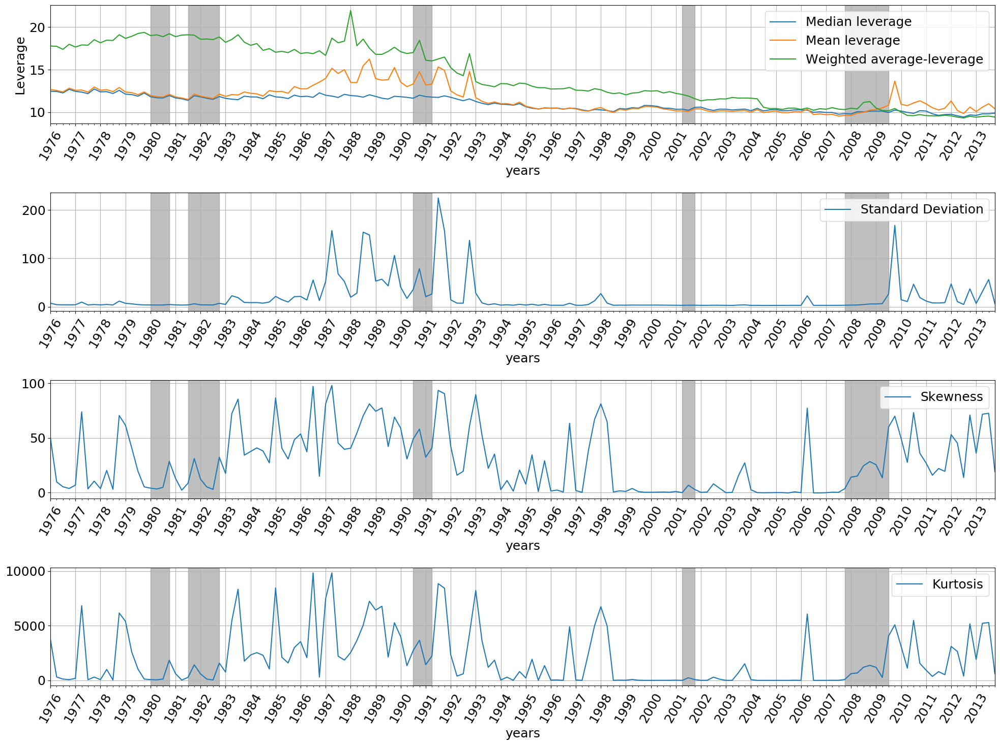

In [13]:
fig, ax = plt.subplots(4,1,figsize=(20,15))
ax = ax.ravel()

#set labels



#plot
#df_all_grouped.plot(ax=ax[0], y=["leverageRatio"])
#df_all_grouped_mean.plot(ax=ax[0], y=["leverageRatio"]["mean"])
df_all_grouped_mean.leverageRatio["median"].plot(ax=ax[0])
df_all_grouped_mean.leverageRatio["mean"].plot(ax=ax[0])
df_all_grouped_mean.weigh_leverage.plot(ax=ax[0])

df_all_grouped_mean.leverageRatio["skew"].plot(ax=ax[2])
df_all_grouped_mean.leverageRatio["kurt"].plot(ax=ax[3])


df_all_grouped_mean.leverageRatio["std"].plot(ax=ax[1])
#ax[0].plot(df_all_grouped_mean.leverageRatio["mean"])
#df_weigh_leverage.plot(ax=ax[0], y=["weigh_leverage"])
#set xaxis ticks
#years = [str(year) for year in range(1976, 2014)]
#ax[0].set_xticks(range(0,152,4))
#ax[0].xaxis.set_minor_locator(AutoMinorLocator(4))
#ax[0].grid()
#ax[0].set_xticklabels(years, rotation=60)
#ax[0].set_xlim(0,151)
ax[0].set_ylabel("Leverage")



axsetting(ax[0])
axsetting(ax[1])
axsetting(ax[2])
axsetting(ax[3])

#legend
ax[0].legend(["Median leverage", "Mean leverage", "Weighted average-leverage"])
ax[1].legend(["Standard Deviation"])
ax[2].legend(["Skewness"])
ax[3].legend(["Kurtosis"])


plt.tight_layout()
plt.savefig('LatexVorlage/graphs/NewLeverage_LeverageRatioAllBanks_7613.png')

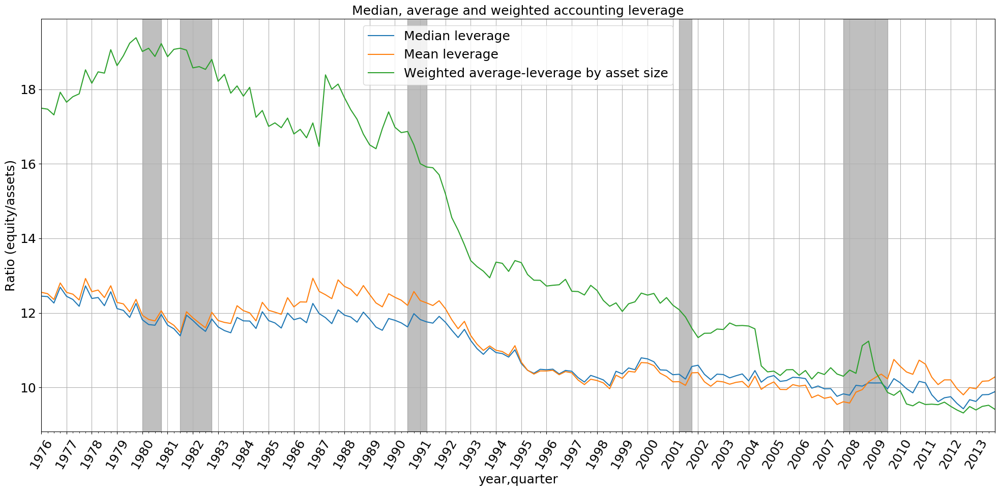

In [14]:
#removing outliers


fig, ax = plt.subplots(figsize=(20,10))

#set labels
ax.set_xlabel("Year")
ax.set_title("Median, average and weighted accounting leverage")


#plot
df_all_grouped_median_noOutlier.plot(ax=ax, y=["leverageRatio"])
df_all_grouped_mean_noOutlier.plot(ax=ax, y=["leverageRatio"])
df_weigh_leverage_noOutlier.plot(ax=ax, y=["weigh_leverage"])
#set xaxis ticks
years = [str(year) for year in range(1976, 2014)]
ax.set_xticks(range(0,152,4))
ax.xaxis.set_minor_locator(AutoMinorLocator(4))
ax.grid()
ax.set_xticklabels(years, rotation=60)
ax.set_xlim(0,151)
ax.set_ylabel("Ratio (equity/assets)")

#legend
ax.legend(["Median leverage", "Mean leverage", "Weighted average-leverage by asset size"])

plot_crisis(ax)

plt.tight_layout()
plt.savefig('LatexVorlage/graphs/NewLeverage_LeverageRatioAllBanks_noOutlier_7613.png')

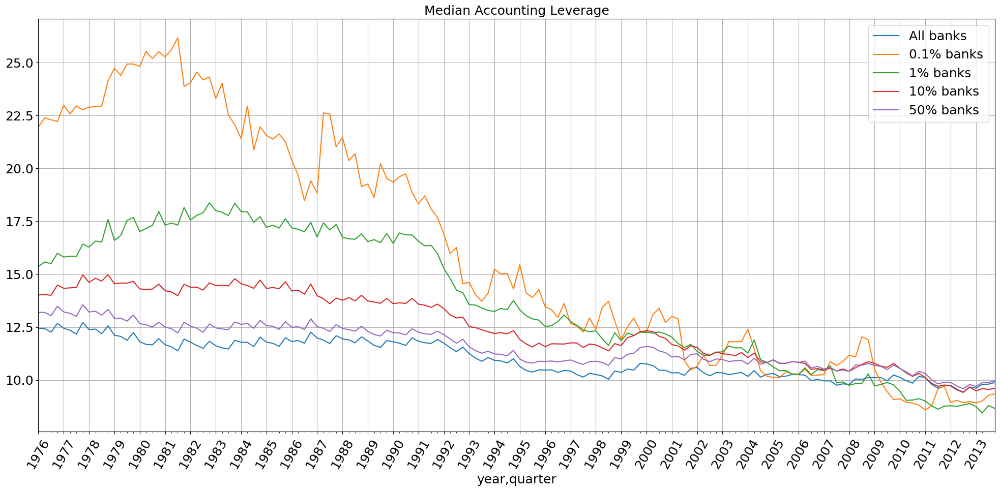

In [15]:



fig, ax = plt.subplots(figsize=(20,10))
#ax.set_xticks(df_years_mean.index)
#ax.set_xticklabels(df_years_mean.index, rotation=60)
ax.set_xlabel("Year")
ax.set_title("Median Accounting Leverage")

years = [str(year) for year in range(1976, 2014)]
ax.set_xticks(range(0,152,4))

ax.xaxis.set_minor_locator(AutoMinorLocator(4))

df_all_grouped.leverageRatio.plot(ax=ax)
df_aggOnePercent.leverageRatio.plot(ax=ax)
df_aggFivePercent.leverageRatio.plot(ax=ax)
df_aggTenPercent.leverageRatio.plot(ax=ax)
df_aggFiftyPercent.leverageRatio.plot(ax=ax)
ax.legend(["All banks", "0.1% banks", "1% banks", "10% banks", "50% banks"])

ax.set_xticklabels(years, rotation=60)
#ax.plot(df_all_grouped.leverageRatio,"g-")
#ax.plot(df_all_grouped.leverageRatio,"oy")
#ax.xaxis.set_major_locator(plt.MaxNLocator(10))
#ax.xaxis.set_minor_locator(plt.FixedLocator(8))
ax.set_xlim(0,151)

ax.grid(True)

plt.tight_layout()
plt.savefig('LatexVorlage/graphs/NewLeverage_LeverageRatioMedian_7613.png')

In [16]:
df1 = pd.concat([df_all_grouped.leverageRatio,df_aggOnePercent.leverageRatio, df_aggFivePercent.leverageRatio, 
                   df_aggTenPercent.leverageRatio, df_aggFiftyPercent.leverageRatio], axis=1)


df1.corr()

,leverageRatio,leverageRatio,leverageRatio,leverageRatio,leverageRatio
leverageRatio,1.000000,0.916298,0.930805,0.964352,0.982872
leverageRatio,0.916298,1.000000,0.953434,0.955887,0.931410
leverageRatio,0.930805,0.953434,1.000000,0.980369,0.933648
leverageRatio,0.964352,0.955887,0.980369,1.000000,0.978596
leverageRatio,0.982872,0.931410,0.933648,0.978596,1.000000


Mean Leverage Ratio

In [17]:
df_aggOnePercent = topOnePercent.groupby(["year", "quarter"]).mean()
df_aggFivePercent = topFivePercent.groupby(["year", "quarter"]).mean()
df_aggTenPercent = topTenPercent.groupby(["year", "quarter"]).mean()
df_aggFiftyPercent = topFiftyPercent.groupby(["year", "quarter"]).mean()

In [18]:
df_all_grouped = df_all.groupby(["year", "quarter"]).mean() #computing average leverage per year and quarter

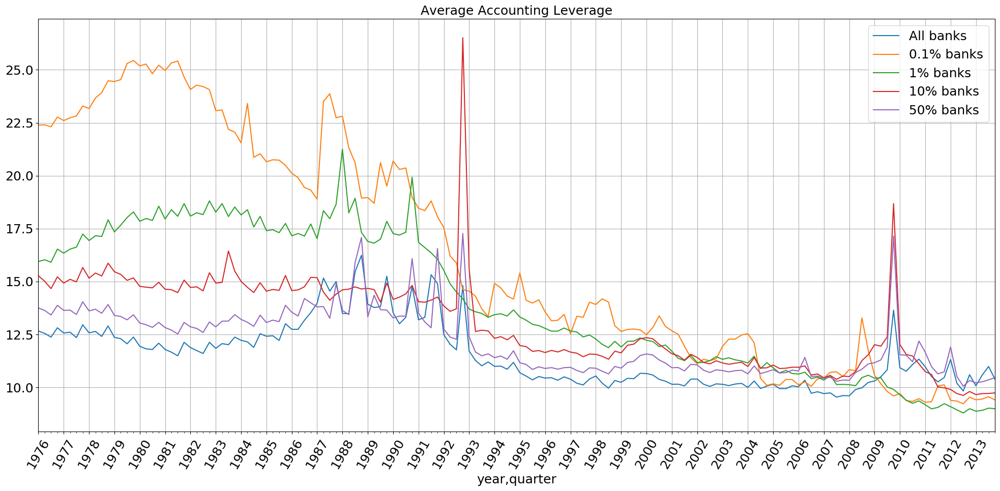

In [19]:



fig, ax = plt.subplots(figsize=(20,10));
#ax.set_xticks(df_years_mean.index)
#ax.set_xticklabels(df_years_mean.index, rotation=60)
ax.set_xlabel("Year")
ax.set_title("Average Accounting Leverage")

years = [str(year) for year in range(1976, 2014)]
ax.set_xticks(range(0,152,4))

ax.xaxis.set_minor_locator(AutoMinorLocator(4))
ax.grid()
df_all_grouped.leverageRatio.plot(ax=ax)
df_aggOnePercent.leverageRatio.plot(ax=ax)
df_aggFivePercent.leverageRatio.plot(ax=ax)
df_aggTenPercent.leverageRatio.plot(ax=ax)
df_aggFiftyPercent.leverageRatio.plot(ax=ax)
ax.legend(["All banks", "0.1% banks", "1% banks", "10% banks", "50% banks"])

ax.set_xticklabels(years, rotation=60)
#ax.plot(df_all_grouped.leverageRatio,"g-")
#ax.plot(df_all_grouped.leverageRatio,"oy")
#ax.xaxis.set_major_locator(plt.MaxNLocator(10))
#ax.xaxis.set_minor_locator(plt.FixedLocator(8))

ax.set_xlim(0,151)

ax.grid(True)

plt.tight_layout()
plt.savefig('LatexVorlage/graphs/NewLeverage_LeverageRatioMean_7613.png')

Trends

In [20]:
df_aggOnePercent = topOnePercent.groupby(["year", "quarter"]).median()
df_aggFivePercent = topFivePercent.groupby(["year", "quarter"]).median()
df_aggTenPercent = topTenPercent.groupby(["year", "quarter"]).median()
df_aggFiftyPercent = topFiftyPercent.groupby(["year", "quarter"]).median()

df_all_grouped = df_all.groupby(["year", "quarter"]).median()

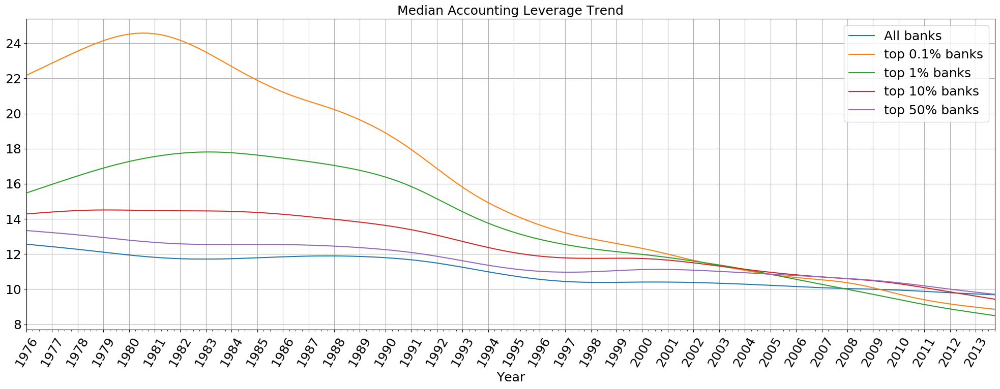

In [21]:
fig, ax = plt.subplots(figsize=(20,8))







#compute filter and plot
cycle, trend = sm.tsa.filters.hpfilter(df_all_grouped.leverageRatio, 1600)
trend.plot(ax=ax)
#cycle.plot(ax=ax[1])
cycle, trend = sm.tsa.filters.hpfilter(df_aggOnePercent.leverageRatio, 1600)
trend.plot(ax=ax)
#cycle.plot(ax=ax[1])
cycle, trend = sm.tsa.filters.hpfilter(df_aggFivePercent.leverageRatio, 1600)
trend.plot(ax=ax)
#cycle.plot(ax=ax[1])
cycle, trend = sm.tsa.filters.hpfilter(df_aggTenPercent.leverageRatio, 1600)
trend.plot(ax=ax)
#cycle.plot(ax=ax[1])
cycle, trend = sm.tsa.filters.hpfilter(df_aggFiftyPercent.leverageRatio, 1600)
trend.plot(ax=ax)
#cycle.plot(ax=ax[1])

#first plot settings
ax.set_xlabel("Year")
ax.set_title("Median Accounting Leverage Trend")
ax.legend(["All banks", "top 0.1% banks", "top 1% banks", "top 10% banks", "top 50% banks"])
years = [str(year) for year in range(1976, 2014)]
ax.set_xticks(range(0,152,4))
ax.xaxis.set_minor_locator(AutoMinorLocator(4))
ax.grid()
ax.set_xticklabels(years, rotation=60)
ax.set_xlim(0,151)

'''
#second plot settings
ax[1].set_xlabel("Year")
ax[1].set_title("Median Accounting Leverage Cyclical")
ax[1].legend(["All banks", "top 0.1% banks", "top 1% banks", "top 10% banks", "top 50% banks"])
years = [str(year) for year in range(1976, 2014)]
ax[1].set_xticks(range(0,152,4))
ax[1].xaxis.set_minor_locator(AutoMinorLocator(4))
ax[1].grid()
ax[1].set_xticklabels(years, rotation=60)
ax[1].set_xlim(0,151)
'''


plt.tight_layout()
plt.savefig('LatexVorlage/graphs/NewLeverage_LeverageRatioTrends_7613.png')

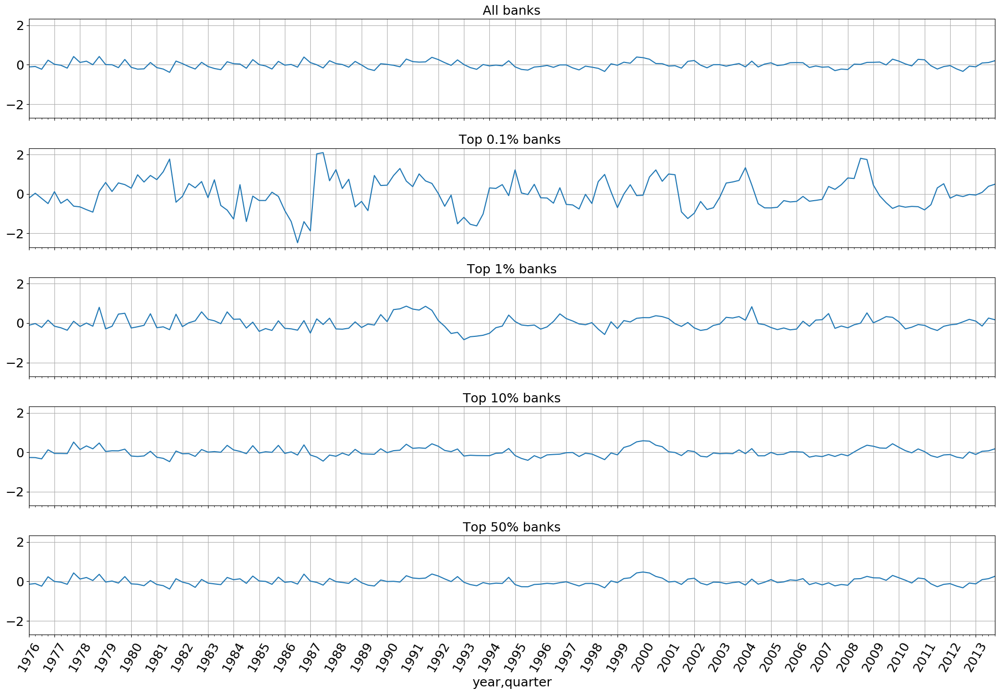

In [22]:
fig, ax = plt.subplots(5,1,figsize=(20,14), sharex=True, sharey=True)
ax.ravel()

#compute filter and plot
cycle_all, trend_all = sm.tsa.filters.hpfilter(df_all_grouped.leverageRatio, 1600)
cycle_all.plot(ax=ax[0])
cycle01, trend01 = sm.tsa.filters.hpfilter(df_aggOnePercent.leverageRatio, 1600)
cycle01.plot(ax=ax[1])
cycle1, trend1 = sm.tsa.filters.hpfilter(df_aggFivePercent.leverageRatio, 1600)
cycle1.plot(ax=ax[2])
cycle10, trend10 = sm.tsa.filters.hpfilter(df_aggTenPercent.leverageRatio, 1600)
cycle10.plot(ax=ax[3])
cycle50, trend50 = sm.tsa.filters.hpfilter(df_aggFiftyPercent.leverageRatio, 1600)
cycle50.plot(ax=ax[4])

#set titles
ax[0].set_title("All banks")
ax[1].set_title("Top 0.1% banks ")
ax[2].set_title("Top 1% banks")
ax[3].set_title("Top 10% banks")
ax[4].set_title("Top 50% banks")

#set xaxis
ax[4].set_xticks(range(0,152,4))
ax[4].xaxis.set_minor_locator(AutoMinorLocator(4))
ax[4].set_xticklabels(years, rotation=60)
ax[4].set_xlim(0,151)

#set grid
for i in range(0,5):
    ax[i].grid(True)



plt.tight_layout()
plt.savefig('LatexVorlage/graphs/NewLeverage_LeverageRatioCyclical_7613.png')

Correlation Cycle

In [23]:
frame = { 'Top 0.1%': cycle01, 'Top 1%': cycle1, 
         'Top 10%': cycle10, 'Top 50%': cycle50,'all': cycle_all  } 

df_corr = pd.DataFrame(frame)

df_corr.corr()

,Top 0.1%,Top 1%,Top 10%,Top 50%,all
Top 0.1%,1.000000,0.379420,-0.036197,-0.066906,-0.139683
Top 1%,0.379420,1.000000,0.550396,0.478778,0.428349
Top 10%,-0.036197,0.550396,1.000000,0.910656,0.815758
Top 50%,-0.066906,0.478778,0.910656,1.000000,0.951774
all,-0.139683,0.428349,0.815758,0.951774,1.000000


Default banks per quarter. Research Playground...

In [24]:
temp_df = df_all_raw.copy()
temp_df = temp_df.reset_index()
temp_df_default = temp_df[temp_df.leverageRatio<0]


df_2009_default = temp_df_default[(temp_df_default.year==2009) & (temp_df_default.quarter==4) ]

df_2010_raw = temp_df[(temp_df.year==2010) & (temp_df.quarter==1)]
df_20102_raw = temp_df[(temp_df.year==2010) & (temp_df.quarter==2)]
df_20103_raw = temp_df[(temp_df.year==2010) & (temp_df.quarter==3)]
df_20104_raw = temp_df[(temp_df.year==2010) & (temp_df.quarter==4)]
df_2011_raw = temp_df[(temp_df.year==2011) & (temp_df.quarter==1)]

Default banks clean work

In [25]:
temp_df = df_all_raw.copy()
temp_df = temp_df.reset_index()
temp_df_default = temp_df[temp_df.leverageRatio<0]

count_banks = temp_df.groupby(["year", "quarter"]).count().rssdid

s_default = temp_df_default.groupby(["year", "quarter"]).count().rssdid

d_default_noIndex = s_default.reset_index()
count_banks_noIndex = count_banks.reset_index()

Solving problem that some years are missing, because of no brankruptcies that year. Filling with null values.

In [26]:
year = 1976

for i in range(0,37):
    if (d_default_noIndex[d_default_noIndex.year == year].rssdid.count() == 0):
        data = {"year" : [year,year,year,year] ,"quarter" : [1,2,3,4] ,"rssdid" : [0,0,0,0]}
        d1 = pd.DataFrame(data)
        d_default_noIndex = d_default_noIndex.append(d1, ignore_index=True )
        #print(year)
        year = year + 1
        continue
    for j in range(1,5):
        temp_df = d_default_noIndex[d_default_noIndex.year==year]
        if (temp_df[temp_df.quarter == j].rssdid.count() == 0):
            #print(str(year) + str(j))
            d_default_noIndex = d_default_noIndex.append({"year": year, "quarter" : j, "rssdid" : 0}, ignore_index=True)
            #print(d_default_noIndex)
    year = year + 1 
    
d_default_noIndex.sort_values(by=["year", "quarter"], inplace=True)

In [27]:
d_default_noIndex["PercentageDefaults"] = d_default_noIndex.rssdid / count_banks_noIndex.rssdid

d_default_noIndex["Percentage"] = d_default_noIndex["PercentageDefaults"]*100

d_default_averageYear = d_default_noIndex.groupby(["year"]).mean()

#store variable for OtherDescriptive_clean notebook
%store d_default_averageYear

Stored 'd_default_averageYear' (DataFrame)


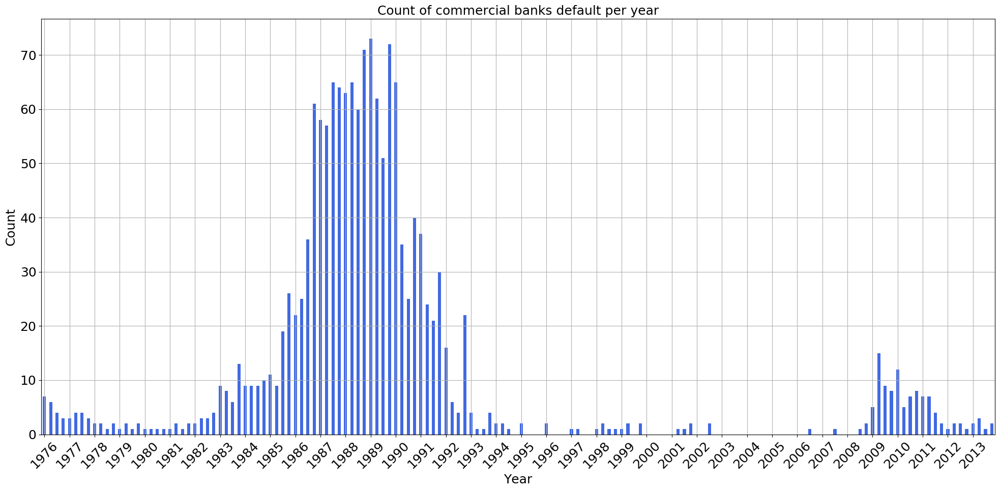

In [28]:
fig, ax = plt.subplots(figsize=(20,10))
ax.set_title("Count of commercial banks default per year")
ax.set_ylabel("Count")
ax.set_xlabel("Year")
#ax.set_xticklabels(years, rotation=90)

#df_agg_growth_year.plot.bar(ax=ax, y=["growth"], color=df_agg_growth_year.positive.map({True: 'r', False: 'g'}))
d_default_noIndex.rssdid.plot(kind="bar",color="royalblue", use_index=False)

years = [str(year) for year in range(1975, 2014)]

years = [str(year) for year in range(1976, 2014)]
ax.set_xticks(range(0,152,4))
ax.set_xticklabels(years, rotation=45)

ax.grid(True)
plt.tight_layout()
plt.savefig('LatexVorlage/graphs/DescriptiveStats/NewLeverage_BanksDefault_7613.png')

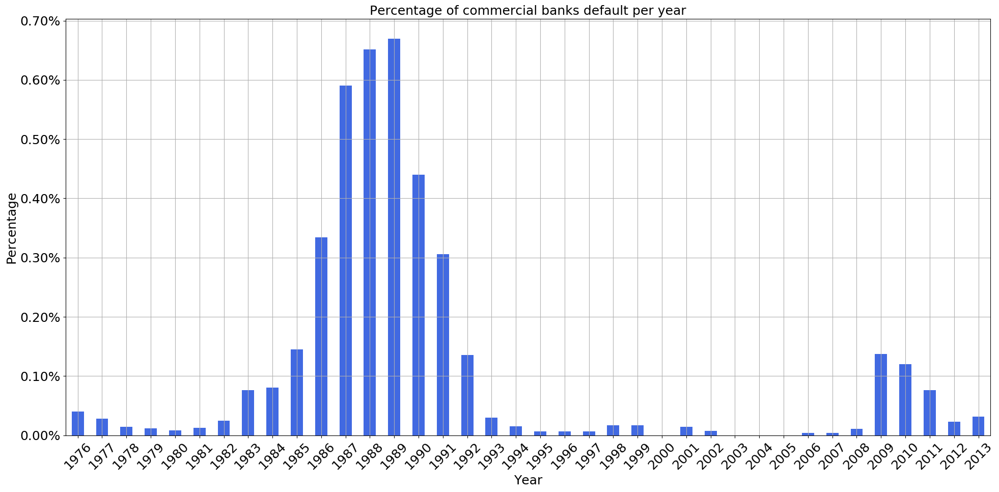

In [29]:
fig, ax = plt.subplots(figsize=(20,10))
ax.set_title("Percentage of commercial banks default per year")
ax.set_ylabel("Percentage")
ax.set_xlabel("Year")
#ax.set_xticklabels(years, rotation=90)

#df_agg_growth_year.plot.bar(ax=ax, y=["growth"], color=df_agg_growth_year.positive.map({True: 'r', False: 'g'}))
d_default_averageYear.Percentage.plot(kind="bar",color="royalblue", use_index=False)


years = [str(year) for year in range(1975, 2014)]

years = [str(year) for year in range(1976, 2014)]
ax.set_xticks(range(0,38))
ax.set_xticklabels(years, rotation=45)
ax.yaxis.set_major_formatter(ticker.PercentFormatter())

ax.grid(True)
plt.tight_layout()
plt.savefig('LatexVorlage/graphs/DescriptiveStats/NewLeverage_BanksDefaultPercentage_7613.png')

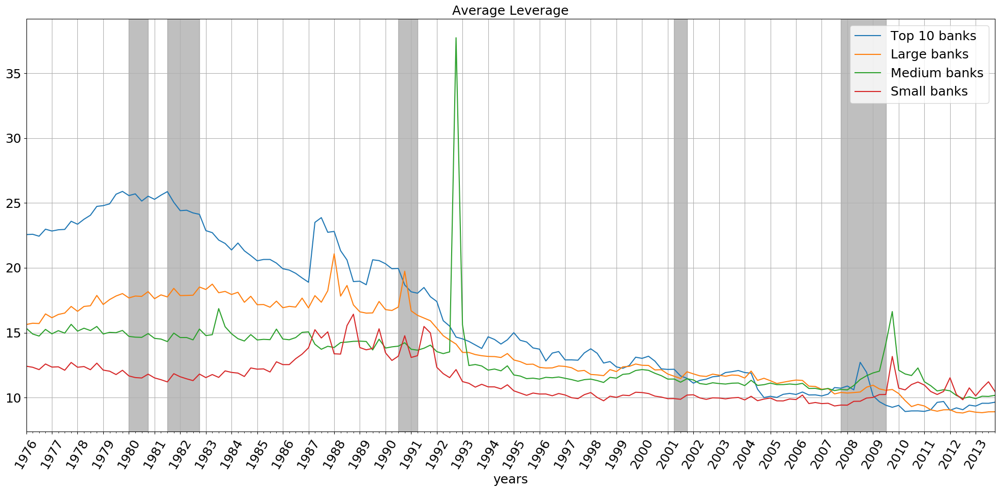

In [30]:
fig, ax = plt.subplots(figsize=(20,10))



for cat in array_cat_group_liab:
    #group
    temp = cat.groupby(["year", "quarter"]).agg({"leverageRatio" : ["mean", "std", "skew", pd.Series.kurt]})
    #plot
    temp.leverageRatio["mean"].plot(ax=ax)


ax.legend(["Top 10 banks", "Large banks", "Medium banks", "Small banks"])
ax.set_title("Average Leverage")
axsetting(ax)
#ax[1].set_title("Standard Devation")
#ax[2].set_title("Skewness")
#ax[3].set_title("Kurtosis")

#for i in range(4):
#    axsetting(ax[i])
#    ax[i].legend(["Top 10 (cat1)", "Top 11-100 (cat2)", "Top 101-1000 (cat3)", "Top 1000-Rest (cat4)"])



plt.tight_layout()
plt.savefig('LatexVorlage/graphs/DescriptiveStats/NewLeverage_LeverageCategories_7613.png')

Leverage Standard Deviation per category

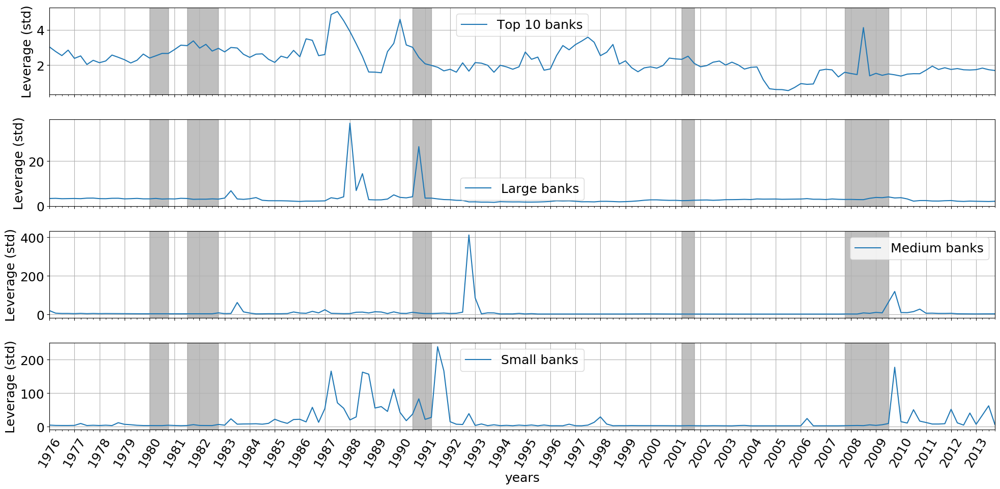

In [31]:
def pop_std(x):
    return x.std(ddof=0)

fig, ax = plt.subplots(4,1,figsize=(20,10), sharex=True)
ax = ax.ravel()

i = 0

for cat in array_cat_group_liab:
    #group
    #temp = cat[cat.leverageRatio < 500]
    temp = cat.groupby(["year", "quarter"]).agg({"leverageRatio" : ["mean", pop_std, "skew", pd.Series.kurt]})
    #plot
    temp.leverageRatio["pop_std"].plot(ax=ax[i])
    axsetting(ax[i])
    ax[i].set_ylabel("Leverage (std)")
    #ax[i].legend(["cat " + str(i+1)])
    i = i + 1


ax[0].legend(["Top 10 banks"])
ax[1].legend(["Large banks"])
ax[2].legend(["Medium banks"])
ax[3].legend(["Small banks"])


plt.tight_layout()
plt.savefig('LatexVorlage/graphs/NewLeverage_stdByCat_7613.png')

Cyclical Standard Deviation by cat

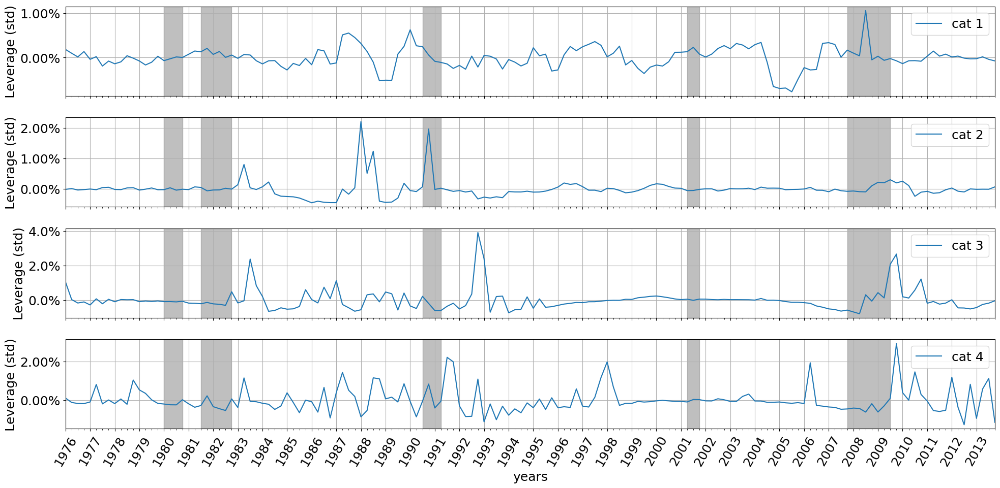

In [32]:
fig, ax = plt.subplots(4,1,figsize=(20,10), sharex=True)
ax = ax.ravel()

i = 0

for cat in array_cat_group_liab:
    #group
    #temp = cat[cat.leverageRatio < 500]
    temp = cat.groupby(["year", "quarter"]).agg({"leverageRatio" : ["mean", pop_std, "skew", pd.Series.kurt]})
    #compute cyclical
    cycle_all, trend_all = sm.tsa.filters.hpfilter(np.log(temp.leverageRatio["pop_std"]), 1600)
    #plot
    cycle_all.plot(ax=ax[i])
    axsetting(ax[i])
    ax[i].set_ylabel("Leverage (std)")
    ax[i].legend(["cat " + str(i+1)])
    ax[i].yaxis.set_major_formatter(ticker.PercentFormatter())
    i = i + 1
    


plt.tight_layout()
plt.savefig('LatexVorlage/graphs/NewLeverage_stdByCat_cyclical_7613.png')

Average cyclical leverage per category

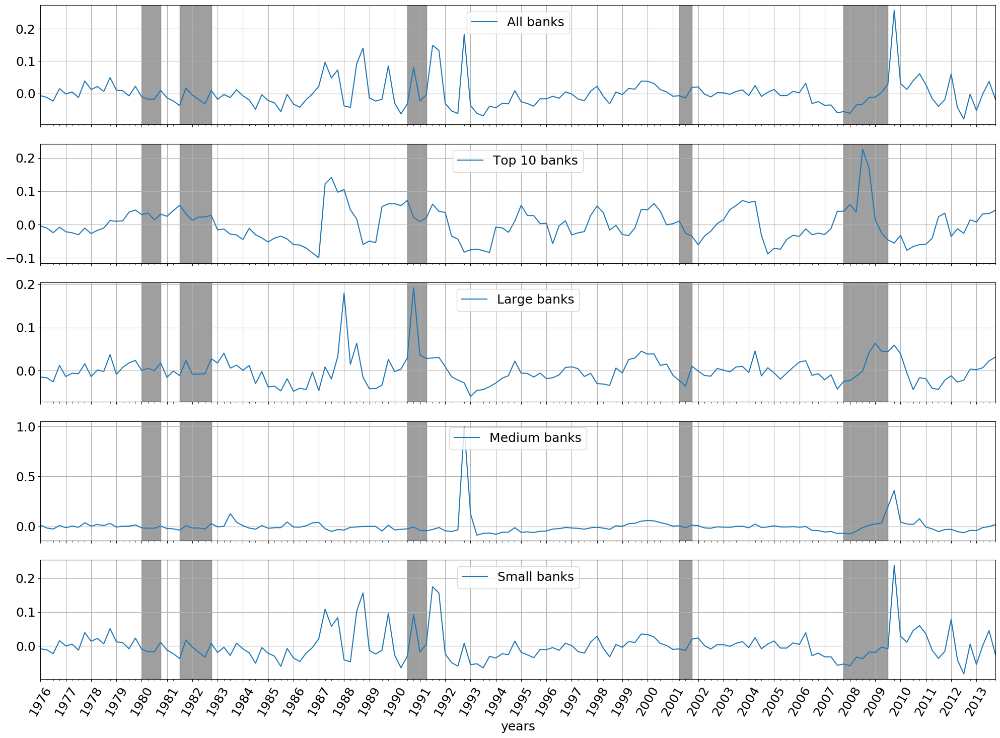

In [33]:
fig, ax = plt.subplots(5,1,figsize=(20,15), sharex=True)
ax = ax.ravel()

#dataframe to save cyclical
df_cyclical_leverage_cat = pd.DataFrame()

#All banks leverage cyclical
cycle_allbanks, trend_all = sm.tsa.filters.hpfilter(np.log(df_all_grouped_mean.leverageRatio["mean"]), 1600)
#cycle_temp, trend_temp = sm.tsa.filters.hpfilter(df_all_grouped_mean.leverageRatio["mean"], 1600)
cycle_allbanks.plot(ax=ax[0])
ax[0].legend(["All banks"])
axsetting(ax[0])

plot_crisis(ax[0])
i = 1

for cat in array_cat_group_liab:
    #if (i == 3):
    #    cat = cat[cat.leverageRatio < 2000]
    temp = cat.groupby(["year", "quarter"]).mean()
    cycle_all, trend_all = sm.tsa.filters.hpfilter(np.log(temp.leverageRatio), 1600)
    #save cyclical
    df_cyclical_leverage_cat["cyclical_leverage_cat" + str(i)] = cycle_all
    cycle_all.plot(ax=ax[i])
    #assets
    #cycle_all, trend_all = sm.tsa.filters.hpfilter(np.log(temp.assets), 1600)
    #cycle_all.plot(ax=ax[i])
    
    #equity
    #cycle_all, trend_all = sm.tsa.filters.hpfilter(np.log(temp.equity), 1600)
    #cycle_all.plot(ax=ax[i])
    
    plot_crisis(ax[i])
    #ax[i].legend(["cat " + str(i)])
    axsetting(ax[i])
    i = i + 1


ax[1].legend(["Top 10 banks"])
ax[2].legend(["Large banks"])
ax[3].legend(["Medium banks"])
ax[4].legend(["Small banks"])    

plt.tight_layout()

plt.savefig('LatexVorlage/graphs/DescriptiveStats/NewLeverage_AverageLeverageCyclical_7613.png')

-0.05629748395699711

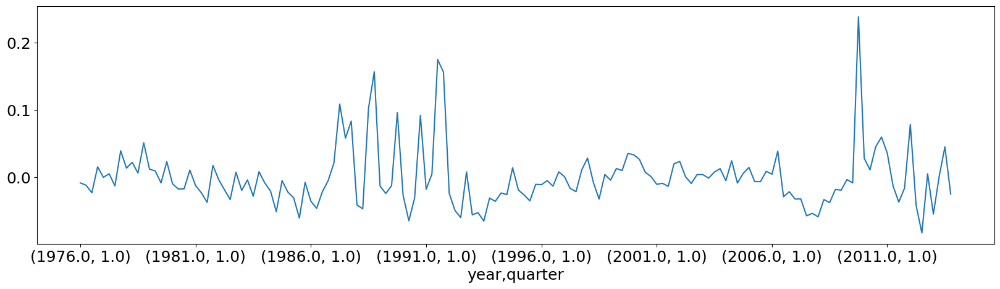

In [34]:
df_nobhc = df_raw[["name", "bhcid", "rssdid","assets",'year', "quarter", "equity"]]

df_nobhc["leverage"] = df_nobhc.assets / df_nobhc.equity

df_nobhc.leverage.replace([np.inf, -np.inf], np.nan, inplace=True)
df_nobhc.dropna(how="all", subset=["leverage"], inplace=True)

df_nobhc = df_nobhc[df_nobhc.leverage > 0]

df_nobhc_mean = df_nobhc.groupby(["year", "quarter"]).mean()
df_nobhc_sum = df_nobhc.groupby(["year", "quarter"]).sum()


cycle_leverage, trend_all = sm.tsa.filters.hpfilter(np.log(df_nobhc_mean.leverage), 1600)
cycle_assets, trend_all = sm.tsa.filters.hpfilter(np.log(df_nobhc_sum.assets), 1600)
#cycle_temp, trend_temp = sm.tsa.filters.hpfilter(df_all_grouped_mean.leverageRatio["mean"], 1600)
cycle_all.plot(figsize=(20,5))

#cycle_allbanks.corr(cycle_all)

cycle_assets, trend_all = sm.tsa.filters.hpfilter(np.log(df_nobhc_sum.assets), 1600)
cycle_assets_bhc, trend_all = sm.tsa.filters.hpfilter(np.log(df_all_grouped_mean.agg_assets), 1600)

#cycle_assets.corr(cycle_assets_bhc)

cycle_leverage.corr(cycle_assets)


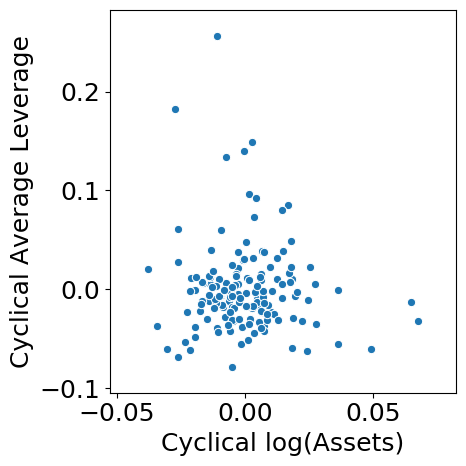

In [35]:
fig, ax = plt.subplots(figsize=(5,5))

cycle_leverage, trend_all = sm.tsa.filters.hpfilter(np.log(df_all_grouped_mean.leverageRatio["mean"]), 1600)

cycle_assets, trend_all = sm.tsa.filters.hpfilter(np.log(df_all_grouped_mean.agg_assets), 1600)

sns.scatterplot(x=cycle_assets, y=cycle_leverage, ax = ax)

ax.set_ylabel("Cyclical Average Leverage")
ax.set_xlabel("Cyclical log(Assets)")


plt.tight_layout()
plt.savefig('LatexVorlage/graphs/DescriptiveStats/NewLeverage_ScatterCyclicalLeverageAssets_7613.png')

In [36]:
temp_df_crisis = df_cyclical_leverage_cat[(df_cyclical_leverage_cat.index.get_level_values(0) >= 2007) & (df_cyclical_leverage_cat.index.get_level_values(0) <= 2010) ]

def color_negative_red(value):
    color = 'red' if value > 0.04 else 'default'
    
    return 'background-color: %s' % color

temp_df_crisis.style.applymap(color_negative_red)

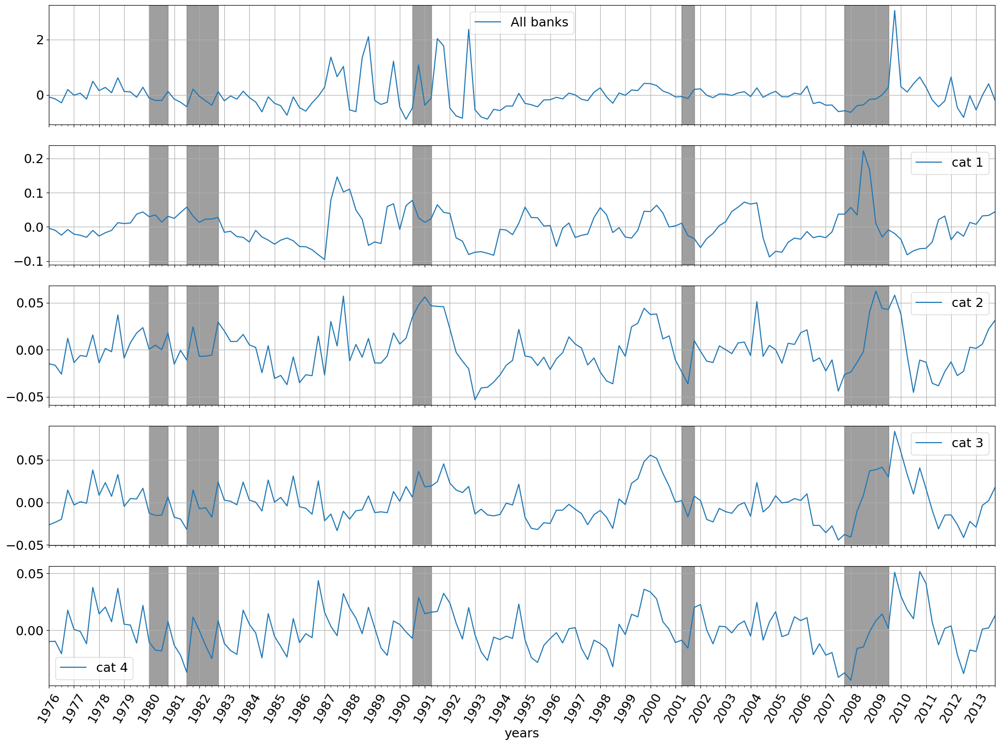

In [37]:
fig, ax = plt.subplots(5,1,figsize=(20,15), sharex=True)
ax = ax.ravel()

#All banks leverage cyclical
cycle_all, trend_all = sm.tsa.filters.hpfilter(df_all_grouped_mean.leverageRatio["mean"], 1600)
cycle_all.plot(ax=ax[0])
ax[0].legend(["All banks"])
axsetting(ax[0])

plot_crisis(ax[0])
i = 1

for cat in array_cat_group_liab:
    q_low = cat["leverageRatio"].quantile(0.001)
    q_hi  = cat["leverageRatio"].quantile(0.999)

    cat = cat[(cat["leverageRatio"] < q_hi) & (cat["leverageRatio"] > q_low)]
    #if (i == 3):
    #    cat = cat[cat.leverageRatio < 2000]
    temp = cat.groupby(["year", "quarter"]).mean()
    cycle_all, trend_all = sm.tsa.filters.hpfilter(np.log(temp.leverageRatio), 1600)
    cycle_all.plot(ax=ax[i])
    plot_crisis(ax[i])
    ax[i].legend(["cat " + str(i)])
    axsetting(ax[i])
    i = i + 1

    
plt.tight_layout()
plt.savefig('LatexVorlage/graphs/DescriptiveStats/NewLeverage_AverageLeverageCyclical_OutlierFilter_7613.png')

Median cyclical leverage per category

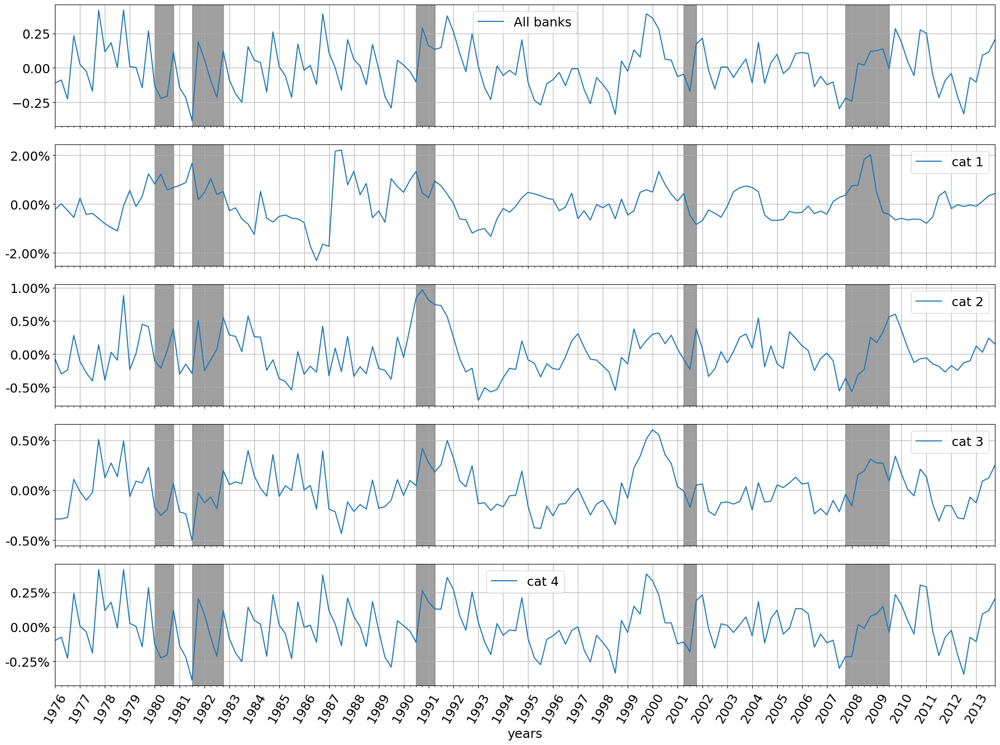

In [38]:
fig, ax = plt.subplots(5,1,figsize=(20,15), sharex=True)
ax = ax.ravel()

#All banks leverage cyclical
cycle_all, trend_all = sm.tsa.filters.hpfilter(df_all_grouped_mean.leverageRatio["median"], 1600)
cycle_all.plot(ax=ax[0])
ax[0].legend(["All banks"])
axsetting(ax[0])

plot_crisis(ax[0])
i = 1

for cat in array_cat_group_liab:
    temp = cat.groupby(["year", "quarter"]).median()
    cycle_all, trend_all = sm.tsa.filters.hpfilter(temp.leverageRatio, 1600)
    cycle_all.plot(ax=ax[i])
    plot_crisis(ax[i])
    ax[i].legend(["cat " + str(i)])
    axsetting(ax[i])
    ax[i].yaxis.set_major_formatter(ticker.PercentFormatter())
    i = i + 1

    
plt.tight_layout()
plt.savefig('LatexVorlage/graphs/DescriptiveStats/NewLeverage_MedianLeverageCyclical_7613.png')

Kurtosis & Skewness by Category

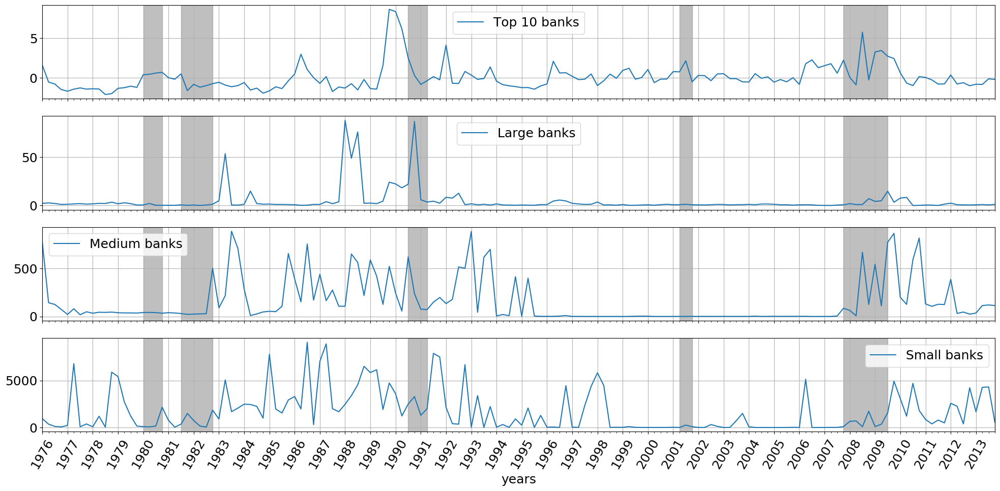

In [39]:
fig, ax = plt.subplots(4,1,figsize=(20,10), sharex=True)
ax = ax.ravel()

i = 0

for cat in array_cat_group_liab:
    #group
    #temp = cat[cat.leverageRatio < 500]
    temp = cat.groupby(["year", "quarter"]).agg({"leverageRatio" : ["mean", pop_std, "skew", pd.Series.kurt]})
    #plot
    temp.leverageRatio["kurt"].plot(ax=ax[i])
    axsetting(ax[i])
    #ax[i].legend(["cat " + str(i+1)])
    i = i + 1

ax[0].legend(["Top 10 banks"])
ax[1].legend(["Large banks"])
ax[2].legend(["Medium banks"])
ax[3].legend(["Small banks"])  
    
plt.tight_layout()
plt.savefig('LatexVorlage/graphs/NewLeverage_KurtByCat_7613.png')

Cyclical Kurtosis by cat

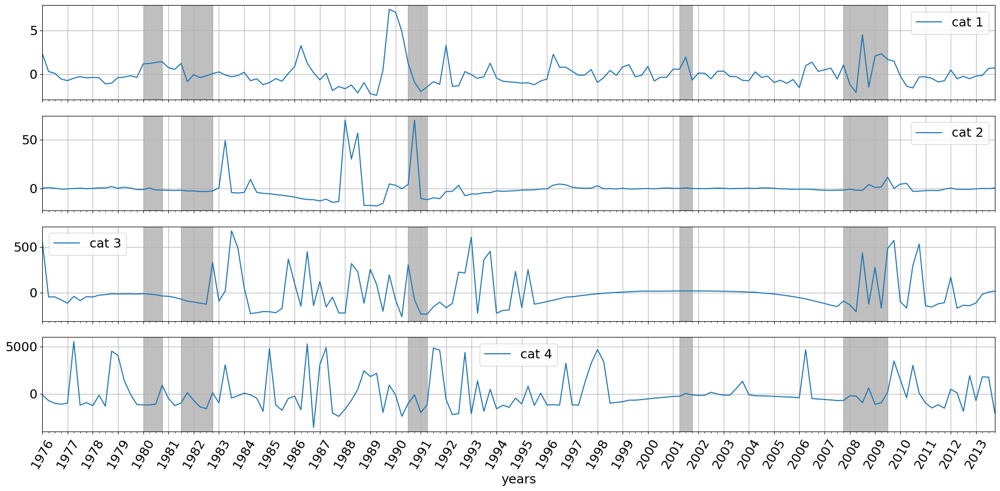

In [40]:
fig, ax = plt.subplots(4,1,figsize=(20,10), sharex=True)
ax = ax.ravel()

i = 0

for cat in array_cat_group_liab:
    #group
    #temp = cat[cat.leverageRatio < 500]
    temp = cat.groupby(["year", "quarter"]).agg({"leverageRatio" : ["mean", pop_std, "skew", pd.Series.kurt]})
    #compute cyclical
    cycle_all, trend_all = sm.tsa.filters.hpfilter(temp.leverageRatio["kurt"], 1600)
    #plot
    cycle_all.plot(ax=ax[i])
    axsetting(ax[i])
    ax[i].legend(["cat " + str(i+1)])
    i = i + 1


plt.tight_layout()
plt.savefig('LatexVorlage/graphs/NewLeverage_KurtByCat_cyclical_7613.png')

Skewness

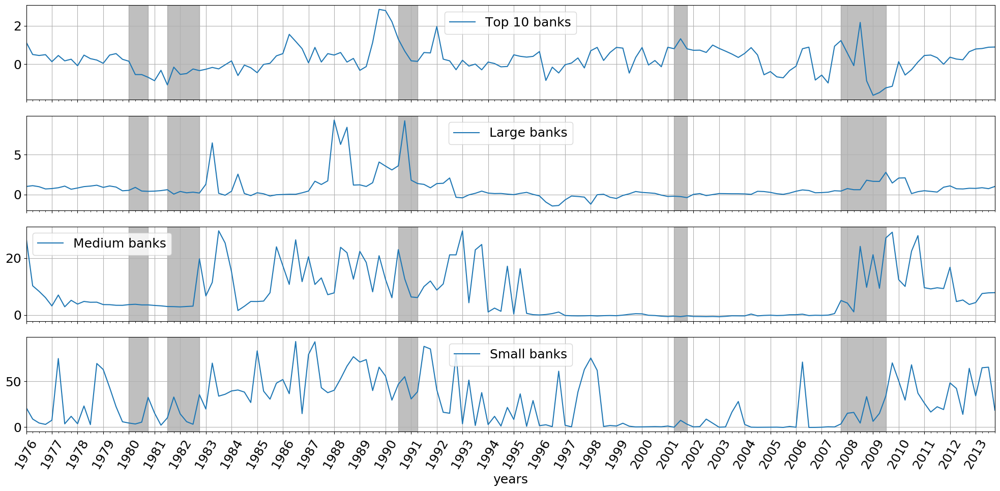

In [41]:
fig, ax = plt.subplots(4,1,figsize=(20,10), sharex=True)
ax = ax.ravel()

i = 0

for cat in array_cat_group_liab:
    #group
    temp = cat.groupby(["year", "quarter"]).agg({"leverageRatio" : ["mean", pop_std, "skew", pd.Series.kurt]})
    #plot
    temp.leverageRatio["skew"].plot(ax=ax[i])
    axsetting(ax[i])
    #ax[i].legend(["cat " + str(i+1)])
    i = i + 1

ax[0].legend(["Top 10 banks"])
ax[1].legend(["Large banks"])
ax[2].legend(["Medium banks"])
ax[3].legend(["Small banks"])  
    
plt.tight_layout()
plt.savefig('LatexVorlage/graphs/NewLeverage_SkewByCat_7613.png')

Cyclical Skewness by cat

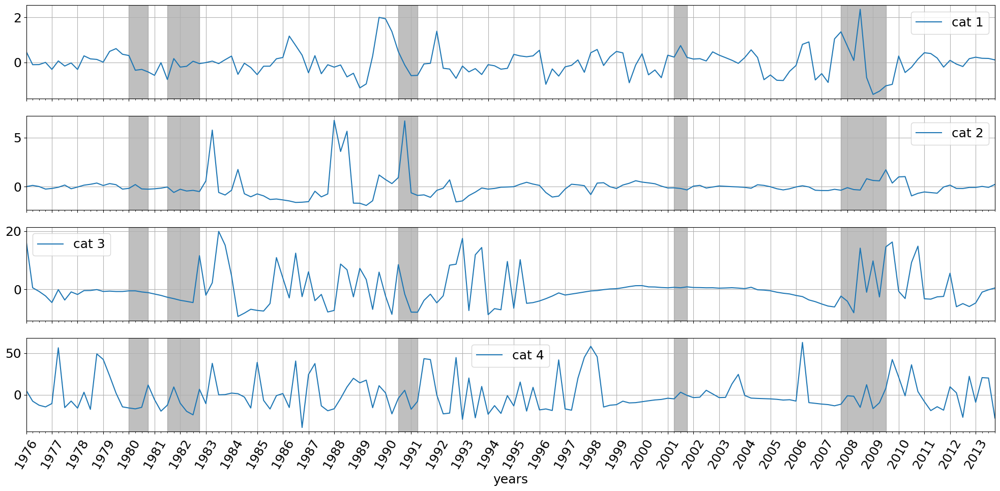

In [42]:
fig, ax = plt.subplots(4,1,figsize=(20,10), sharex=True)
ax = ax.ravel()

i = 0

for cat in array_cat_group_liab:
    #group
    temp = cat.groupby(["year", "quarter"]).agg({"leverageRatio" : ["mean", pop_std, "skew", pd.Series.kurt]})
    #compute cyclical
    cycle_all, trend_all = sm.tsa.filters.hpfilter(temp.leverageRatio["skew"], 1600)
    #cycle_rate = cycle_all/temp.leverageRatio["skew"]
    #plot
    cycle_all.plot(ax=ax[i])
    axsetting(ax[i])
    ax[i].legend(["cat " + str(i+1)])
    i = i + 1


plt.tight_layout()
plt.savefig('LatexVorlage/graphs/NewLeverage_SkewByCat_cyclical_7613.png')

Scatterplot for assets vs leverage

In [43]:
for cat in array_cat_group_liab:
    cat["logAssets"] = np.log(cat.assets)

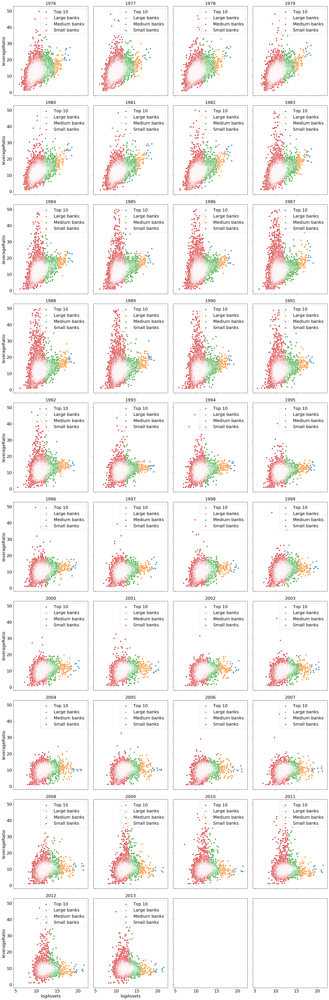

In [44]:
fig, ax = plt.subplots(10, 4,figsize=(20,60), sharex=True, sharey=True)
ax = ax.ravel() 
year=1976
x = 0

for x in range(38):
    for cat in array_cat_group_liab:
        temp = cat[cat.leverageRatio <=50]
        temp = temp[(temp.year == year) & (temp.quarter==4)]
        sns.scatterplot(x="logAssets", y="leverageRatio",ax=ax[x], data=temp)
    ax[x].legend(["Top 10", "Large banks", "Medium banks", "Small banks"])
    ax[x].set_title(year)
    year = year + 1
    

plt.tight_layout()
plt.savefig('LatexVorlage/graphs/DescriptiveStats/NewLeverage_ScatterAssetsLeverage_7613.png')

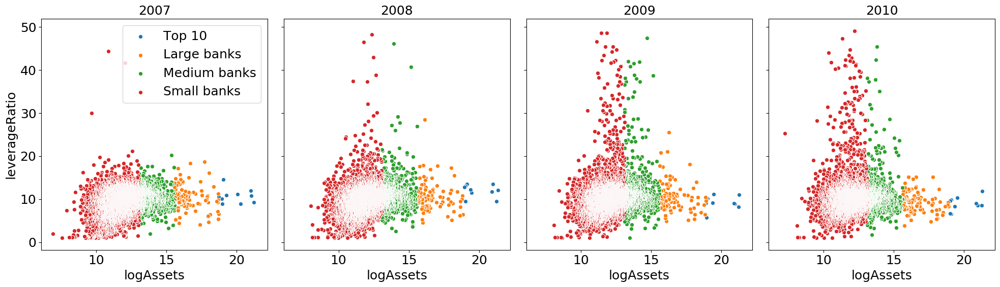

In [45]:
fig, ax = plt.subplots(1, 4,figsize=(20,6), sharex=True, sharey=True)
ax = ax.ravel() 
year=2007
x = 0

for x in range(4):
    for cat in array_cat_group_liab:
        temp = cat[cat.leverageRatio <=50]
        temp = temp[(temp.year == year) & (temp.quarter==4)]
        sns.scatterplot(x="logAssets", y="leverageRatio",ax=ax[x], data=temp)
    
    ax[x].set_title(year)
    year = year + 1
    
ax[0].legend(["Top 10", "Large banks", "Medium banks", "Small banks"])
plt.tight_layout()
plt.savefig('LatexVorlage/graphs/DescriptiveStats/NewLeverage_ScatterAssetsLeverageFinancCrisis_7613.png')

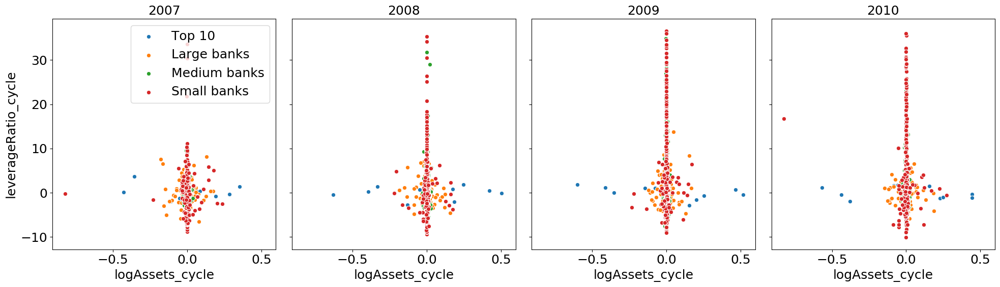

In [46]:
fig, ax = plt.subplots(1, 4,figsize=(20,6), sharex=True, sharey=True)
ax = ax.ravel() 
year=2007
x = 0

for x in range(4):
    for cat in array_cat_group_liab:
        temp = cat[cat.leverageRatio <=50]
        temp = temp[(temp.year == year) & (temp.quarter==4)]
        cycle_leverage, trend_all = sm.tsa.filters.hpfilter(temp.leverageRatio, 1600)
        cycle_assets, trend_all = sm.tsa.filters.hpfilter(temp.logAssets, 1600)
        sns.scatterplot(x=cycle_assets, y=cycle_leverage,ax=ax[x])
    
    ax[x].set_title(year)
    year = year + 1
    
ax[0].legend(["Top 10", "Large banks", "Medium banks", "Small banks"])

plt.tight_layout()

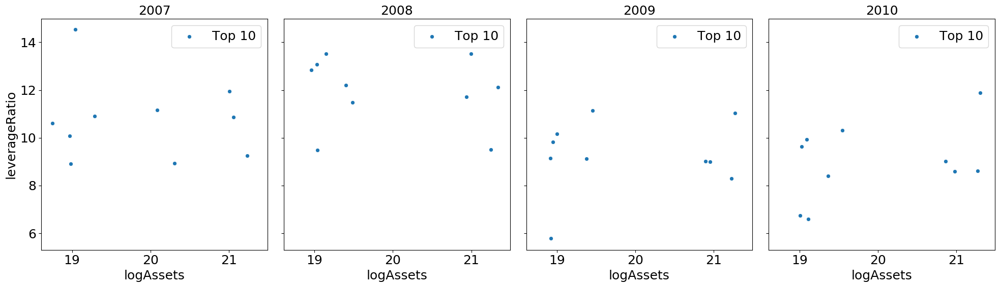

In [47]:
fig, ax = plt.subplots(1, 4,figsize=(20,6), sharex=True, sharey=True)
ax = ax.ravel() 
year=2007
x = 0

for x in range(4):
    temp = array_cat_group_liab[0]
    temp = temp[(temp.year == year) & (temp.quarter==4)]
    sns.scatterplot(x="logAssets", y="leverageRatio",ax=ax[x], data=temp)
    ax[x].legend(["Top 10", "Large banks", "Medium banks", "Small banks"])
    ax[x].set_title(year)
    year = year + 1
    

plt.tight_layout()
plt.savefig('LatexVorlage/graphs/DescriptiveStats/NewLeverage_ScatterAssetsLeverageFinancCrisis_Top10_7613.png')

Axsis Length: 8
Cat Length: 4
cat: 1
Year: 2007
Axis: 0
Year: 2008
Axis: 1
Year: 2009
Axis: 2
Year: 2010
Axis: 3
cat: 2
Year: 2007
Axis: 4
Year: 2008
Axis: 5
Year: 2009
Axis: 6
Year: 2010
Axis: 7


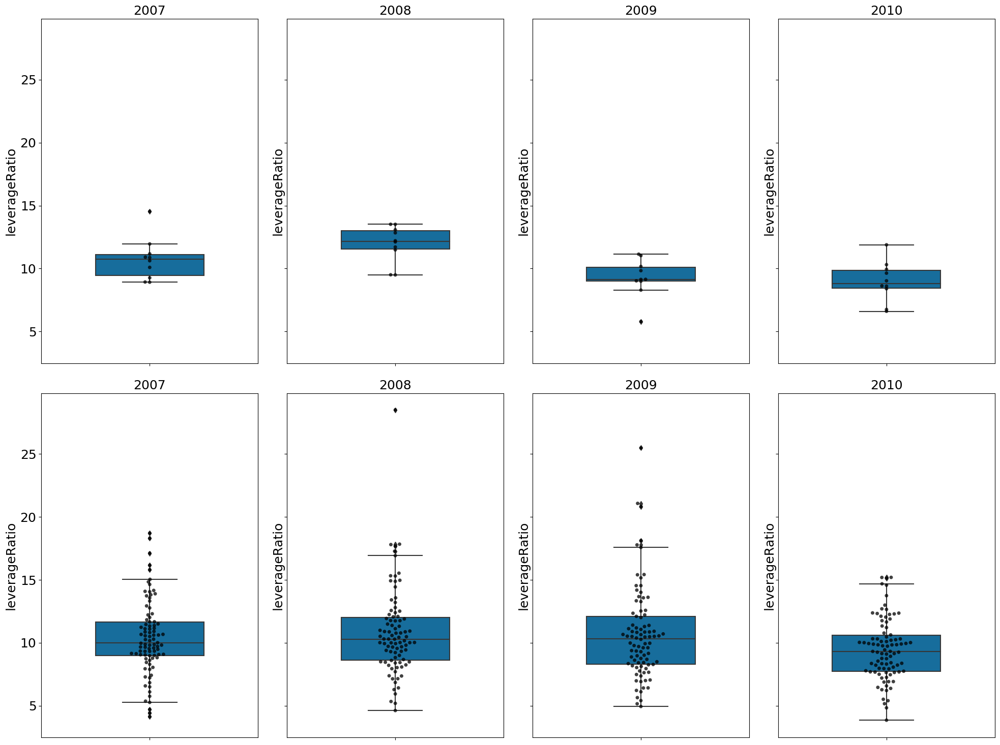

In [48]:
fig, ax = plt.subplots(2, 4,figsize=(20,15), sharex=True, sharey=True)
ax = ax.ravel() 
year=2007
j = 0
i = 0


for cat in array_cat_group_liab[0:2]:
    print("cat: " + str(j+1))
    year = 2007
    for x in range(4):
        temp = cat.copy()
        temp = temp[(temp.year == year) & (temp.quarter==4)]
        sns.swarmplot(y="leverageRatio",ax=ax[i], data=temp, color='black',
              alpha=0.75)
        sns.boxplot(y="leverageRatio",ax=ax[i], data=temp, width=0.5,
                 palette="colorblind")
    #ax[x].legend(["Top 10", "Large banks", "Medium banks", "Small banks"])
        ax[i].set_title(year)
        year = year + 1
        i = i + 1
    j = j + 1

plt.tight_layout()
plt.savefig('LatexVorlage/graphs/DescriptiveStats/NewLeverage_BoxplotLeverageFinancCrisis_Cat1&2_7613.png')